## IMPORT LIBRARIES

In [ ]:
!pip install wget
!pip install keras-tuner --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=5ee985a202b5874c20c51bf40ee04db559ac32740c87473511b4c2e12891ce29
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 133 kB 5.3 MB/s 


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
import seaborn as sns
from wordcloud import WordCloud
from pandas_profiling import ProfileReport
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
import re
import matplotlib.image as mpimg
import tensorflow as tf

from tensorflow.keras import layers, models
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.preprocessing import image
import shutil
from PIL import Image
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow import keras
import keras_tuner
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
import random
from random import sample
import os

## DOWNLOAD DATA

In [ ]:
!wget 'http://andrewjanowczyk.com/wp-static/IDC_regular_ps50_idx5.zip'

--2022-07-03 04:40:44--  http://andrewjanowczyk.com/wp-static/IDC_regular_ps50_idx5.zip
Resolving andrewjanowczyk.com (andrewjanowczyk.com)... 129.22.136.73
Connecting to andrewjanowczyk.com (andrewjanowczyk.com)|129.22.136.73|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1644892042 (1.5G) [application/zip]
Saving to: ‘IDC_regular_ps50_idx5.zip’

IDC_regular_ps50_id 100%[===================>]   1.53G  4.89MB/s    in 9m 19s  

2022-07-03 04:50:04 (2.81 MB/s) - ‘IDC_regular_ps50_idx5.zip’ saved [1644892042/1644892042]



In [ ]:
! unzip IDC_regular_ps50_idx5.zip

Streaming output truncated to the last 5000 lines.
 extracting: 9346/0/9346_idx5_x2351_y2401_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1101_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1151_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1201_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1251_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1301_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1351_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1401_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1451_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1501_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1551_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1601_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1651_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1701_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1751_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1801_class0.png  
 extracting: 9346/0/9346_idx5_x2401_y1851_class0.png  
 extracting: 9

### TPU SETTINGS

In [ ]:
resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
tf.config.experimental_connect_to_cluster(resolver)
# This is the TPU initialization code that has to be at the beginning.
tf.tpu.experimental.initialize_tpu_system(resolver)
print("All devices: ", tf.config.list_logical_devices('TPU'))

INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: grpc://10.84.98.2:8470


INFO:tensorflow:Initializing the TPU system: grpc://10.84.98.2:8470


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Finished initializing TPU system.


All devices:  [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU')]


In [ ]:
strategy = tf.distribute.TPUStrategy(resolver)

INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


## REARRANGE DATA

In [ ]:
import os
os.mkdir("FinalData")
os.mkdir("FinalData/0")
os.mkdir("FinalData/1")

os.mkdir("FinalData/Test")
os.mkdir("FinalData/Test/0")
os.mkdir("FinalData/Test/1")

In [ ]:
from glob import glob
list_dir = glob("*", recursive = True)

In [ ]:
for x in ["FinalData","sample_data","IDC_regular_ps50_idx5.zip","IDC_regular_ps50_idx5.zipt7bbjhk4.tmp"]:
  try:
     list_dir.remove(x)
  except:
    print(x)

IDC_regular_ps50_idx5.zipt7bbjhk4.tmp


In [ ]:
#list_dir = list_dir[:int(len(list_dir)*0.6)]

In [ ]:
training = list_dir[:int(len(list_dir)*0.8)] #[1, 2, 3, 4, 5, 6, 7, 8]
testing = list_dir[-int(len(list_dir)*0.2):] #

In [ ]:
for x in training:
    for i in os.listdir(x+'/0'):
      shutil.move(x+"/0/"+i, "FinalData/0/"+i)
    for i in os.listdir(x+'/1'):
      shutil.move(x+"/1/"+i, "FinalData/1/"+i)


In [ ]:
for x in testing:
  for i in os.listdir(x+'/0'):
    shutil.move(x+"/0/"+i, "FinalData/Test/0/"+i)
  for i in os.listdir(x+'/1'):
      shutil.move(x+"/1/"+i, "FinalData/Test/1/"+i)

### BALANCE DATA_TPU

In [ ]:
for i in list_dir:
  GAP = len(os.listdir(i+"/0"))-len(os.listdir(i+"/1"))
  rots= [90,180,270]
  if GAP>0:
    random_1 = sample(os.listdir(i+"/1"),10)
    for j in range(GAP):
      img = random.choice(random_1)
      im = Image.open(i+"/1/"+img)
      im = im.rotate(random.choice(rots))
      im.save(i+"/1/"+str(j)+"_new"+img)
  elif GAP<0:
    random_1 = sample(os.listdir(i+"/0"),10)
    for j in range(GAP*-1):
      img = random.choice(random_1)
      im = Image.open(i+"/0/"+img)
      im = im.rotate(random.choice(rots))
      im.save(i+"/0/"+str(j)+"_new"+img)


## BALANCE DATA

In [ ]:
print(len(os.listdir("FinalData/0"))) ####IMBALANCE DATA
print(len(os.listdir("FinalData/1")))
print(len(os.listdir("FinalData/Test/0"))) ####IMBALANCE DATA
print(len(os.listdir("FinalData/Test/1")))

101408
37809
22205
8076


In [ ]:
GAP = len(os.listdir("FinalData/0"))-len(os.listdir("FinalData/1"))
random_1 = sample(os.listdir("FinalData/1"),10000)
rots= [90,180,270]
for i in range(GAP):
  img = random.choice(random_1)
  im = Image.open("FinalData/1/"+img)
  im = im.rotate(random.choice(rots))
  im.save("FinalData/1/"+str(i)+"_new"+img)

In [ ]:
train_num_samples = len(os.listdir("FinalData/0"))
print(len(os.listdir("FinalData/0"))) ####BALANCED DATA
print(len(os.listdir("FinalData/1")))

101408
101408


In [ ]:
#!rm -rf FinalData

## WRITE A TF RECORD FILE

In [ ]:
def _bytes_feature(value):
  """Returns a bytes_list from a string / byte."""
  if isinstance(value, type(tf.constant(0))):
    value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
  """Returns a float_list from a float / double."""
  return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def _int64_feature(value):
  """Returns an int64_list from a bool / enum / int / uint."""
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

In [ ]:
def image_example(image_string, label):
  image_shape = tf.io.decode_jpeg(image_string).shape

  feature = {
      'height': _int64_feature(image_shape[0]),
      'width': _int64_feature(image_shape[1]),
      'depth': _int64_feature(image_shape[2]),
      'label': _int64_feature(label),
      'image_raw': _bytes_feature(image_string),
  }

  return tf.train.Example(features=tf.train.Features(feature=feature))

In [ ]:
files = os.listdir('FinalData/0/')+os.listdir('FinalData/1/')
random.seed(42)
random.shuffle(files)

In [ ]:
record_file = 'train_data.tfrecords'
with tf.io.TFRecordWriter(record_file) as writer:
  for filename in files:
    image_string = open("FinalData/"+filename[-5::][0]+"/"+filename, 'rb').read()
    tf_example = image_example(image_string, eval(filename[-5::][0]))
    writer.write(tf_example.SerializeToString())

## READ A TF RECORD FILE

In [ ]:
raw_image_dataset = tf.data.TFRecordDataset('train.tfrecords')

# Create a dictionary describing the features.
image_feature_description = {
    'height': tf.io.FixedLenFeature([], tf.int64),
    'width': tf.io.FixedLenFeature([], tf.int64),
    'depth': tf.io.FixedLenFeature([], tf.int64),
    'label': tf.io.FixedLenFeature([], tf.int64),
    'image_raw': tf.io.FixedLenFeature([], tf.string),
}

def _parse_image_function(example_proto):
  # Parse the input tf.train.Example proto using the dictionary above.
  return tf.io.parse_single_example(example_proto, image_feature_description)

parsed_image_dataset = raw_image_dataset.map(_parse_image_function)

In [ ]:
image_size=[50,50]
for image_features in parsed_image_dataset:
  image_raw = image_features['image_raw']
  image = tf.image.decode_jpeg(image_raw , channels=3)
  image = tf.image.resize(image, [50,50])/255
  plt.imshow(image)
  print(image)
  break

tf.Tensor(
[[[0.9372549  0.92941177 0.93333334]
  [0.9372549  0.93333334 0.93333334]
  [0.9372549  0.92941177 0.93333334]
  ...
  [0.9372549  0.93333334 0.92941177]
  [0.9372549  0.9254902  0.93333334]
  [0.93333334 0.93333334 0.9411765 ]]

 [[0.93333334 0.92941177 0.93333334]
  [0.9372549  0.92941177 0.93333334]
  [0.9372549  0.92941177 0.93333334]
  ...
  [0.90588236 0.8509804  0.8784314 ]
  [0.91764706 0.90588236 0.90588236]
  [0.9372549  0.9254902  0.92941177]]

 [[0.93333334 0.92941177 0.93333334]
  [0.93333334 0.92941177 0.93333334]
  [0.93333334 0.92941177 0.92941177]
  ...
  [0.93333334 0.93333334 0.92941177]
  [0.92156863 0.8784314  0.8980392 ]
  [0.90588236 0.85490197 0.88235295]]

 ...

 [[0.9372549  0.92156863 0.91764706]
  [0.94509804 0.92156863 0.92941177]
  [0.93333334 0.89411765 0.9137255 ]
  ...
  [0.9019608  0.8666667  0.89411765]
  [0.93333334 0.9254902  0.93333334]
  [0.9411765  0.92941177 0.9372549 ]]

 [[0.9411765  0.9254902  0.9411765 ]
  [0.9254902  0.9372549  0

In [ ]:
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32)
    image =  tf.image.resize(image, [50,50])/255
    return image

In [ ]:
def read_tfrecord(example):
    tfrecord_format = (
        {
            "image_raw": tf.io.FixedLenFeature([], tf.string),
            "label": tf.io.FixedLenFeature([], tf.int64),
        }

    )
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example["image_raw"])
    label = tf.cast(example["label"], tf.int32)
    return image, label

In [ ]:
from functools import partial

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
BATCH_SIZE = 64

In [ ]:
def load_dataset(filenames):
    ignore_order = tf.data.Options()
    ignore_order.experimental_deterministic = False  # disable order, increase speed
    dataset = tf.data.TFRecordDataset(
        filenames
    )  # automatically interleaves reads from multiple files
    dataset = dataset.with_options(
        ignore_order
    )  # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(
        partial(read_tfrecord), num_parallel_calls=AUTOTUNE
    )
    # returns a dataset of (image, label) pairs if labeled=True or just images if labeled=False
    return dataset

In [ ]:
def get_dataset(filenames):
    dataset = load_dataset(filenames)
    dataset = dataset.shuffle(1000, seed=42, reshuffle_each_iteration=True)
    dataset = dataset.prefetch(buffer_size=AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE)
    return dataset

In [ ]:
tfds_train = get_dataset("train.tfrecords")

In [ ]:
import math
DATASET_SIZE = math.ceil((train_num_samples*2)/BATCH_SIZE)

UnimplementedError: ignored

In [ ]:
train_size = int(0.8 * DATASET_SIZE)
val_size = int(0.2 * DATASET_SIZE)

train_dataset = tfds_train.take(train_size)
val_dataset = tfds_train.skip(train_size)

In [ ]:
x = 0
y = 0
for i in train_dataset:
  x=x+1
for j in val_dataset:
  y=y+1
print(x,y)

3831 958


In [ ]:
for i in val_dataset.as_numpy_iterator():
  print(i)
  break


(array([[[[230., 204., 219.],
         [240., 242., 243.],
         [244., 238., 243.],
         ...,
         [240., 244., 245.],
         [240., 244., 246.],
         [245., 245., 241.]],

        [[217., 176., 198.],
         [241., 240., 243.],
         [240., 240., 243.],
         ...,
         [243., 244., 242.],
         [242., 243., 242.],
         [241., 240., 246.]],

        [[198., 117., 151.],
         [234., 219., 227.],
         [228., 196., 214.],
         ...,
         [241., 242., 247.],
         [243., 246., 245.],
         [238., 232., 237.]],

        ...,

        [[223., 152., 182.],
         [182., 131., 169.],
         [176., 142., 183.],
         ...,
         [220., 167., 190.],
         [215., 168., 191.],
         [183., 131., 161.]],

        [[223., 149., 181.],
         [195., 132., 172.],
         [142.,  92., 143.],
         ...,
         [209., 138., 173.],
         [188., 139., 172.],
         [207., 137., 177.]],

        [[220., 159., 186.],
      

## DATA GENERATOR FOR CPU/GPU

In [ ]:
INPUT_HEIGHT,INPUT_WIDTH = 64,64

In [ ]:
#Main
train_datagen = ImageDataGenerator(
        rescale=1./255,
        validation_split=0.2,
        )
test_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
        'FinalData',
        target_size=(INPUT_HEIGHT, INPUT_WIDTH),
        batch_size=64,
        class_mode='binary',
        classes=["0", "1"],
        subset='training',shuffle=True,
        seed=42)
valid_generator = train_datagen.flow_from_directory(
        'FinalData',
        target_size=(INPUT_HEIGHT, INPUT_WIDTH),
        batch_size=64,classes=["0", "1"],
        class_mode='binary',
        subset='validation',shuffle=True,
        seed=42)

Found 178170 images belonging to 2 classes.
Found 44542 images belonging to 2 classes.


In [ ]:
test_generator = test_datagen.flow_from_directory(
        'FinalData/Test',
        target_size=(INPUT_HEIGHT, INPUT_WIDTH),
        batch_size=64,classes=["0", "1"],
        class_mode='binary',
        subset='training',shuffle=True,
        seed=42)

Found 53071 images belonging to 2 classes.


## MODEL BUILDING

### GOOD MODEL 1 [BEST TEST LOSS]

In [ ]:
def my_cnn():
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2))),
  model.add(keras.layers.Dropout(0.4)),
  model.add(layers.Conv2D(64, (3, 3), padding="same",activation='relu'))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(BatchNormalization())
  model.add(keras.layers.Dropout(0.4)),
  model.add(Dense(16, activation='relu'))
  model.add(Dense(1, activation='sigmoid'))
  return model

In [ ]:
class LearningRateReducerCb(tf.keras.callbacks.Callback):

  def on_epoch_end(self, epoch, logs={}):
    old_lr = self.model.optimizer.lr.read_value()
    new_lr = old_lr * 0.9
    print("\nEpoch: {}. Reducing Learning Rate from {} to {}".format(epoch, old_lr, new_lr))
    self.model.optimizer.lr.assign(new_lr)

In [ ]:
hist = model.fit(train_generator,epochs=4,validation_data=valid_generator)#0.33,callbacks=[LearningRateReducerCb()]

Epoch 1/4
2741/2741 [==============================] - 103s 37ms/step - loss: 0.3510 - accuracy: 0.8508 - val_loss: 1.6639 - val_accuracy: 0.7183
Epoch 2/4
2741/2741 [==============================] - 101s 37ms/step - loss: 0.3198 - accuracy: 0.8644 - val_loss: 0.5228 - val_accuracy: 0.8150
Epoch 3/4
2741/2741 [==============================] - 102s 37ms/step - loss: 0.3096 - accuracy: 0.8695 - val_loss: 0.8405 - val_accuracy: 0.5632
Epoch 4/4
2741/2741 [==============================] - 101s 37ms/step - loss: 0.3011 - accuracy: 0.8733 - val_loss: 0.3715 - val_accuracy: 0.8441


In [ ]:
model = my_cnn()
opt = tf.keras.optimizers.Adam(learning_rate=0.001,)
model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

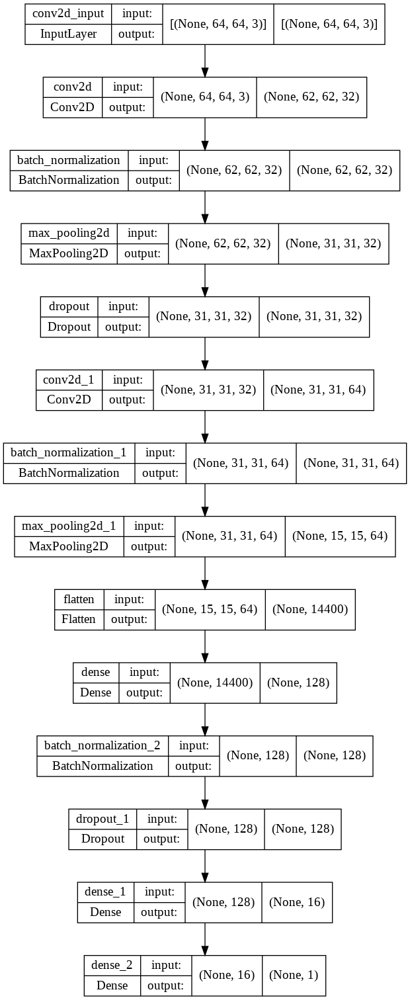

In [ ]:
tf.keras.utils.plot_model(model, to_file="my_model.png", show_shapes=True)

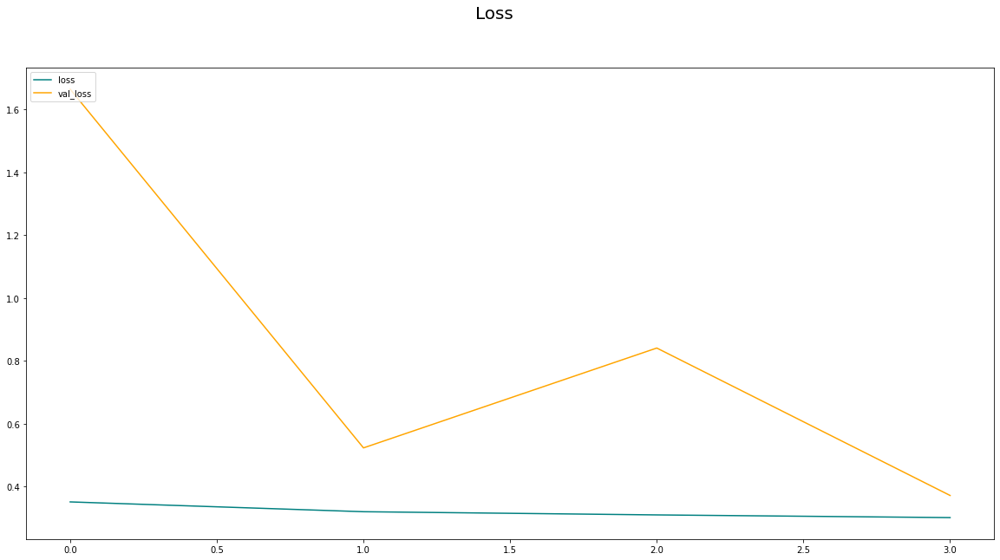

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Loss.png", dpi=199)
plt.show()

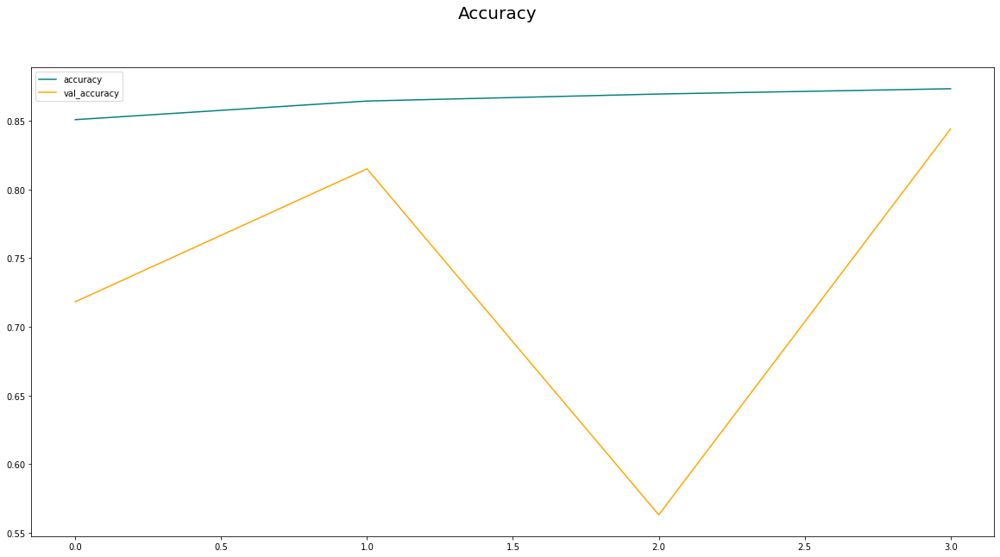

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Accuracy.png", dpi=199)
plt.show()

In [ ]:
scores = model.evaluate(test_generator, verbose=0)
print("Test Loss", scores[0])
print("Test Accuracy", scores[1])

Test Loss 0.34405577182769775
Test Accuracy 0.859403133392334


In [ ]:
model.save_weights('./checkpoints_30/my_checkpoint_30')

In [ ]:
test_data = test_generator.next()
test_data_results = model.predict(test_data[0])
thrhld_results = np.where(test_data_results > 0.5, 1,0)

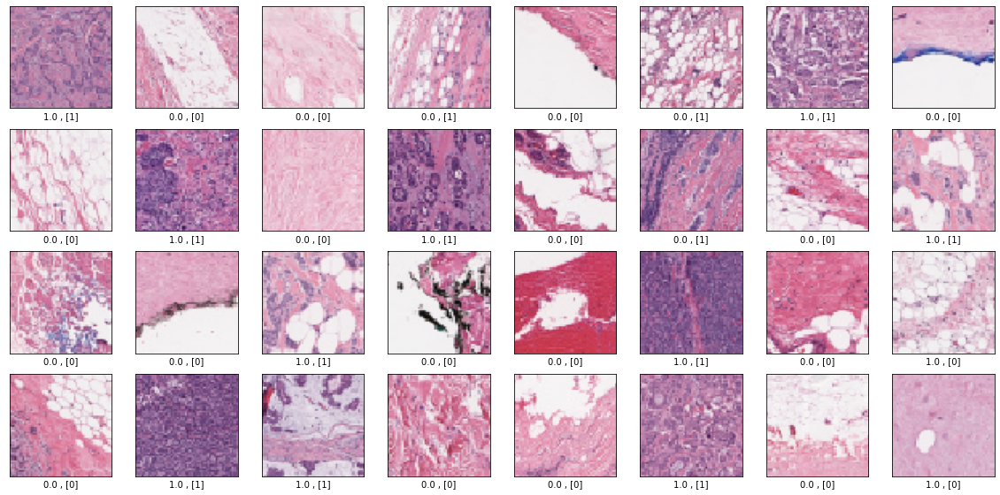

In [ ]:
plt.figure(figsize=(20,20))
for i in range(32):
    plt.subplot(8,8,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_data[0][i])
    plt.xlabel(str(test_data[1][i])+" , "+str(thrhld_results[i]))
plt.show()

### GOOO MODEL 2

In [ ]:
def my_cnn():
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2))),
  model.add(keras.layers.Dropout(0.4)),
  model.add(layers.Conv2D(64, (3, 3), padding="same",activation='relu'))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(Flatten())
  model.add(Dense(128, activation='relu', kernel_regularizer=keras.regularizers.l1(0.0001)))
  model.add(BatchNormalization())
  model.add(keras.layers.Dropout(0.4)),
  model.add(Dense(16, activation='relu'))
  model.add(Dense(1, activation='sigmoid'))
  return model

In [ ]:
class LearningRateReducerCb(tf.keras.callbacks.Callback):

  def on_epoch_end(self, epoch, logs={}):
    old_lr = self.model.optimizer.lr.read_value()
    new_lr = old_lr * 0.9
    print("\nEpoch: {}. Reducing Learning Rate from {} to {}".format(epoch, old_lr, new_lr))
    self.model.optimizer.lr.assign(new_lr)

In [ ]:
model = my_cnn()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005,)
model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
hist = model.fit(train_generator,epochs=2,validation_data=valid_generator,)#0.33,

Epoch 1/2
2784/2784 [==============================] - 128s 46ms/step - loss: 0.8416 - accuracy: 0.8426 - val_loss: 0.7439 - val_accuracy: 0.8253
Epoch 2/2
2784/2784 [==============================] - 116s 42ms/step - loss: 0.6461 - accuracy: 0.8557 - val_loss: 0.6716 - val_accuracy: 0.8278


In [ ]:
model.save_weights('./checkpoints_2/my_checkpoint_2')
model2= my_cnn()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005)
model2.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])
model2.load_weights('./checkpoints_2/my_checkpoint_2')
hist2 = model2.fit(train_generator,epochs=2,validation_data=valid_generator)#0.33

Epoch 1/2
2784/2784 [==============================] - 119s 42ms/step - loss: 0.6012 - accuracy: 0.8632 - val_loss: 0.7673 - val_accuracy: 0.7270
Epoch 2/2
2784/2784 [==============================] - 124s 45ms/step - loss: 0.5599 - accuracy: 0.8655 - val_loss: 0.5998 - val_accuracy: 0.8246


In [ ]:
model2.save_weights('./checkpoints_2_1/my_checkpoint_2_1')
model3= my_cnn()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005)
model3.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])
model3.load_weights('./checkpoints_2_1/my_checkpoint_2_1')
hist3 = model3.fit(train_generator,epochs=2,validation_data=valid_generator)#0.33

Epoch 1/2
2784/2784 [==============================] - 122s 43ms/step - loss: 0.5131 - accuracy: 0.8666 - val_loss: 0.5912 - val_accuracy: 0.8239
Epoch 2/2
2784/2784 [==============================] - 120s 43ms/step - loss: 0.4827 - accuracy: 0.8686 - val_loss: 0.5195 - val_accuracy: 0.8433


In [ ]:
import warnings
warnings.filterwarnings("ignore")

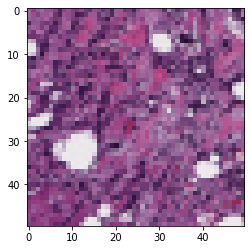

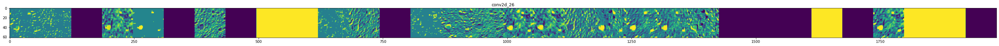

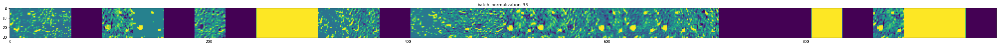

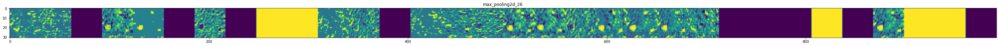

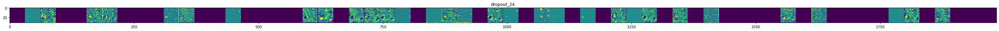

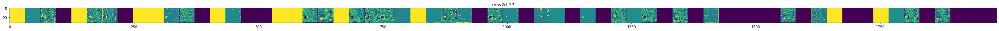

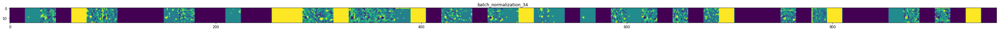

In [ ]:
img_path="FinalData/1/10254_idx5_x1701_y1751_class1.png"
image = plt.imread(img_path)
plt.imshow(image)
plt.show()
latest_model = model3

%matplotlib inline
successive_outputs = [layer.output for layer in latest_model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = latest_model.input, outputs = successive_outputs)
#Load the input image
img = load_img(img_path, target_size=(64, 64))
# Convert ht image to Array of dimension (150,150,3)
x   = img_to_array(img)
x   = x.reshape((1,) + x.shape)
# Rescale by 1/255
x /= 255.0
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in latest_model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:

    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers

    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)

    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))

    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 50. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )

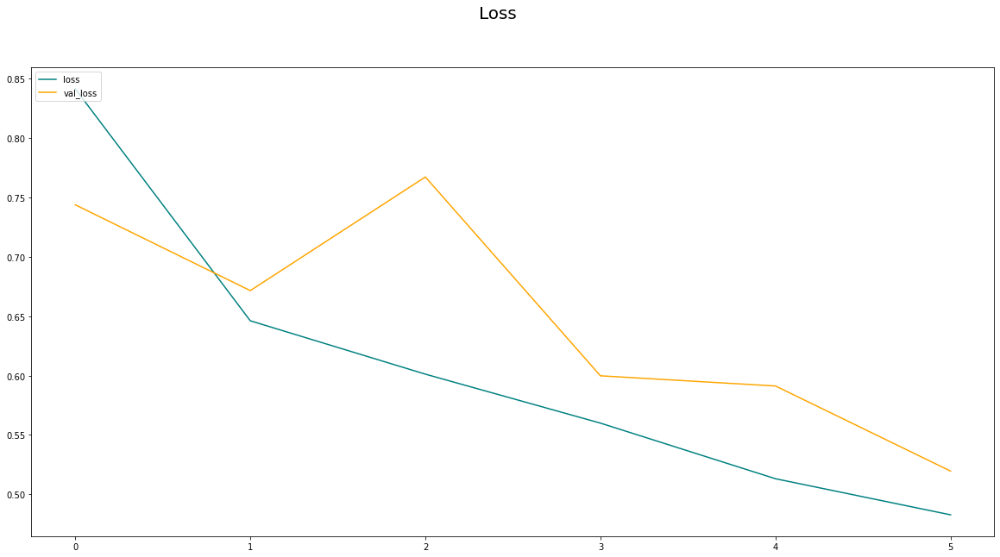

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['loss']+hist2.history['loss']+hist3.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss']+hist2.history['val_loss']+hist3.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Loss.png", dpi=199)
plt.show()

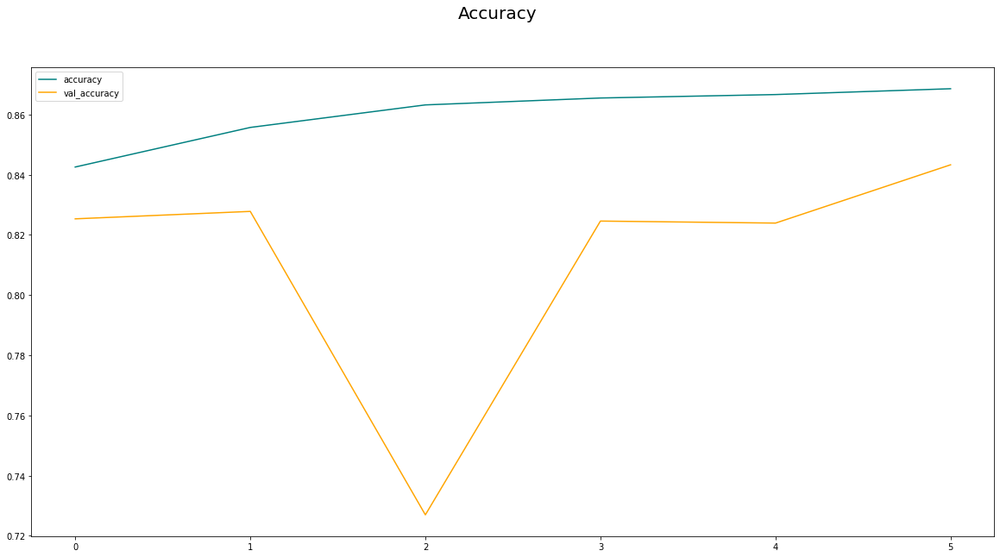

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['accuracy']+hist2.history['accuracy']+hist3.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy']+hist2.history['val_accuracy']+hist3.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Accuracy.png", dpi=199)
plt.show()

In [ ]:
scores = model.evaluate(test_generator, verbose=0)
print("Test Loss", scores[0])
print("Test Accuracy", scores[1])

Test Loss 0.6216025948524475
Test Accuracy 0.8534039258956909


In [ ]:
model.save_weights('./checkpoints_2/my_checkpoint_2')

In [ ]:
shutil.make_archive("checkpoints_2/my_checkpoint_2", 'zip', "checkpoints_2")

'/content/checkpoints_2/my_checkpoint_2.zip'

In [ ]:
test_data = test_generator.next()
test_data_results = model.predict(test_data[0])
thrhld_results = np.where(test_data_results > 0.5, 1,0)

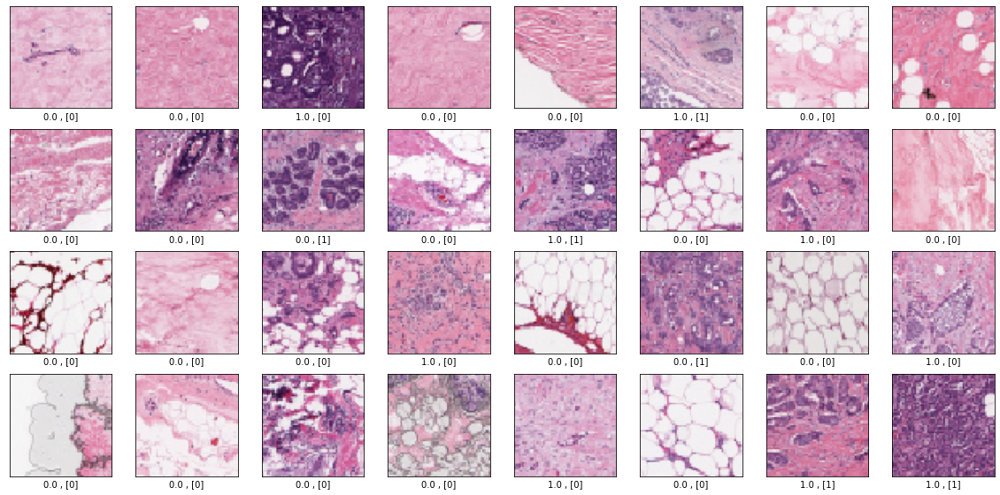

In [ ]:
plt.figure(figsize=(20,20))
for i in range(32):
    plt.subplot(8,8,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_data[0][i])
    plt.xlabel(str(test_data[1][i])+" , "+str(thrhld_results[i]))
plt.show()

### GOOO MODEL 2 (BEST GRAPH)

In [ ]:
def my_cnn():
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2))),
  model.add(keras.layers.Dropout(0.4)),
  model.add(layers.Conv2D(64, (3, 3), padding="same",activation='relu'))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(Flatten())
  model.add(Dense(256, activation='relu', kernel_regularizer=keras.regularizers.l1(0.001)))
  model.add(Dense(128, activation='relu'))
  model.add(BatchNormalization())
  model.add(Dense(1, activation='sigmoid'))
  return model

In [ ]:
class LearningRateReducerCb(tf.keras.callbacks.Callback):

  def on_epoch_end(self, epoch, logs={}):
    old_lr = self.model.optimizer.lr.read_value()
    new_lr = old_lr * 0.9
    print("\nEpoch: {}. Reducing Learning Rate from {} to {}".format(epoch, old_lr, new_lr))
    self.model.optimizer.lr.assign(new_lr)

In [ ]:
model = my_cnn()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005,)
model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

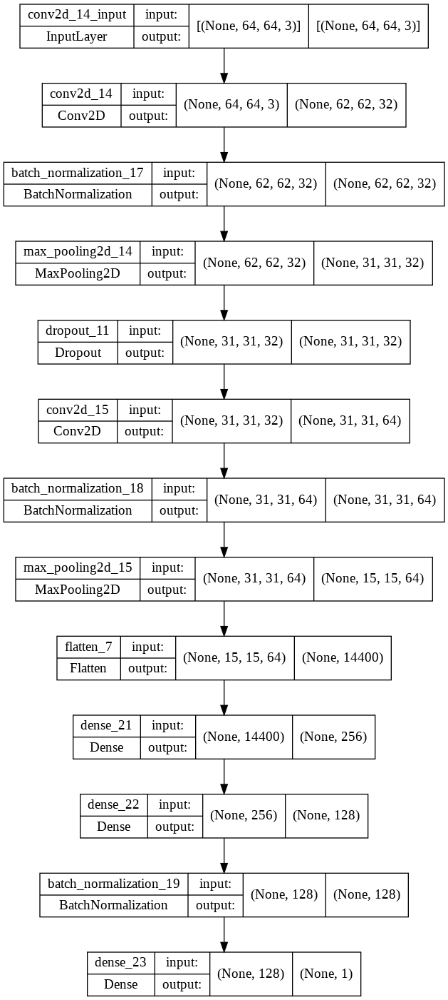

In [ ]:
tf.keras.utils.plot_model(model, to_file="my_model.png", show_shapes=True)

In [ ]:
hist = model.fit(train_generator,epochs=8,validation_data=valid_generator,)#0.33,

Epoch 1/8
2784/2784 [==============================] - 108s 38ms/step - loss: 2.2305 - accuracy: 0.8440 - val_loss: 1.4461 - val_accuracy: 0.8273
Epoch 2/8
2784/2784 [==============================] - 105s 38ms/step - loss: 1.1875 - accuracy: 0.8595 - val_loss: 1.4495 - val_accuracy: 0.5974
Epoch 3/8
2784/2784 [==============================] - 104s 37ms/step - loss: 0.8454 - accuracy: 0.8652 - val_loss: 1.5737 - val_accuracy: 0.6842
Epoch 4/8
2784/2784 [==============================] - 105s 38ms/step - loss: 0.7246 - accuracy: 0.8667 - val_loss: 0.8853 - val_accuracy: 0.7789
Epoch 5/8
2784/2784 [==============================] - 104s 37ms/step - loss: 0.6495 - accuracy: 0.8678 - val_loss: 0.7514 - val_accuracy: 0.7947
Epoch 6/8
2784/2784 [==============================] - 103s 37ms/step - loss: 0.6045 - accuracy: 0.8698 - val_loss: 0.6763 - val_accuracy: 0.8179
Epoch 7/8
2784/2784 [==============================] - 103s 37ms/step - loss: 0.5797 - accuracy: 0.8706 - val_loss: 0.6402 -

In [ ]:
model.save_weights('./checkpoints_2/my_checkpoint_2')
model2= my_cnn()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005)
model2.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])
model2.load_weights('./checkpoints_2/my_checkpoint_2')
hist2 = model2.fit(train_generator,epochs=2,validation_data=valid_generator)#0.33

Epoch 1/2
2784/2784 [==============================] - 107s 38ms/step - loss: 0.5488 - accuracy: 0.8719 - val_loss: 0.6501 - val_accuracy: 0.8145
Epoch 2/2
2784/2784 [==============================] - 112s 40ms/step - loss: 0.5372 - accuracy: 0.8733 - val_loss: 0.6156 - val_accuracy: 0.8289


In [ ]:
model2.save_weights('./checkpoints_2_1/my_checkpoint_2_1')
model3= my_cnn()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005)
model3.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])
model3.load_weights('./checkpoints_2_1/my_checkpoint_2_1')
hist3 = model3.fit(train_generator,epochs=1,validation_data=valid_generator)#0.33

2784/2784 [==============================] - 105s 38ms/step - loss: 0.5309 - accuracy: 0.8745 - val_loss: 0.6010 - val_accuracy: 0.8389


In [ ]:
import warnings
warnings.filterwarnings("ignore")

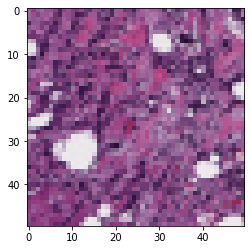

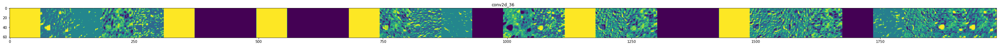

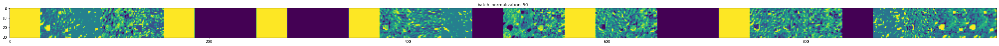

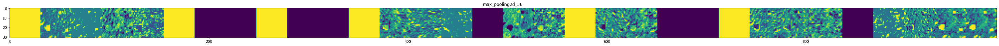

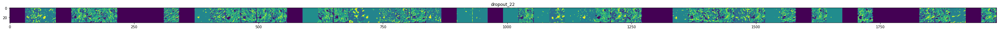

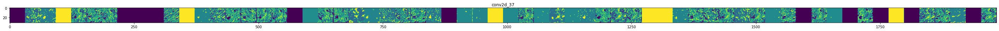

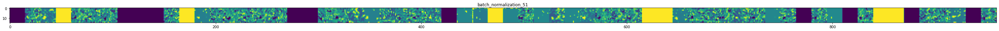

In [ ]:
img_path="FinalData/1/10254_idx5_x1701_y1751_class1.png"
image = plt.imread(img_path)
plt.imshow(image)
plt.show()
latest_model = model3

%matplotlib inline
successive_outputs = [layer.output for layer in latest_model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = latest_model.input, outputs = successive_outputs)
#Load the input image
img = load_img(img_path, target_size=(64, 64))
# Convert ht image to Array of dimension (150,150,3)
x   = img_to_array(img)
x   = x.reshape((1,) + x.shape)
# Rescale by 1/255
x /= 255.0
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in latest_model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:

    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers

    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)

    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))

    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 50. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )

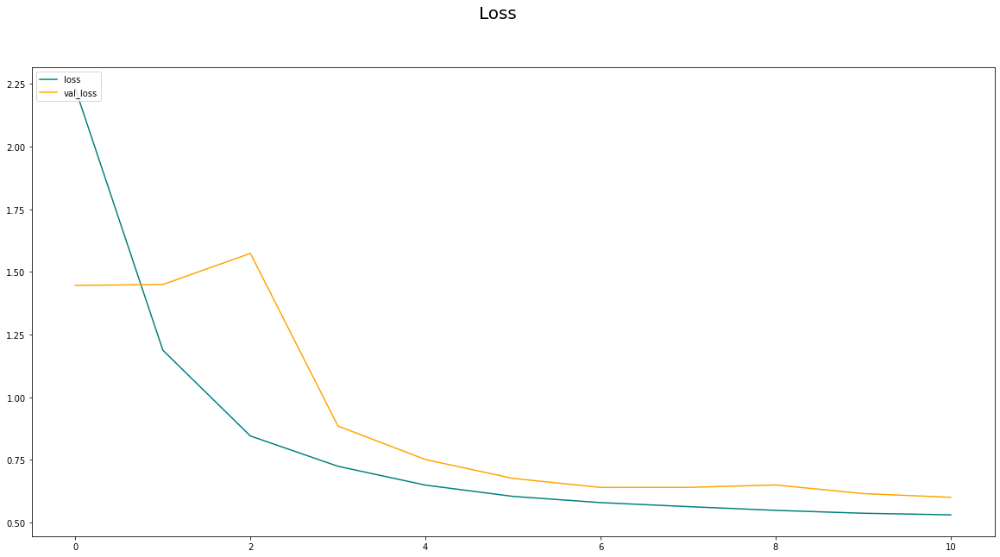

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['loss']+hist2.history['loss']+hist3.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss']+hist2.history['val_loss']+hist3.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Loss.png", dpi=199)
plt.show()

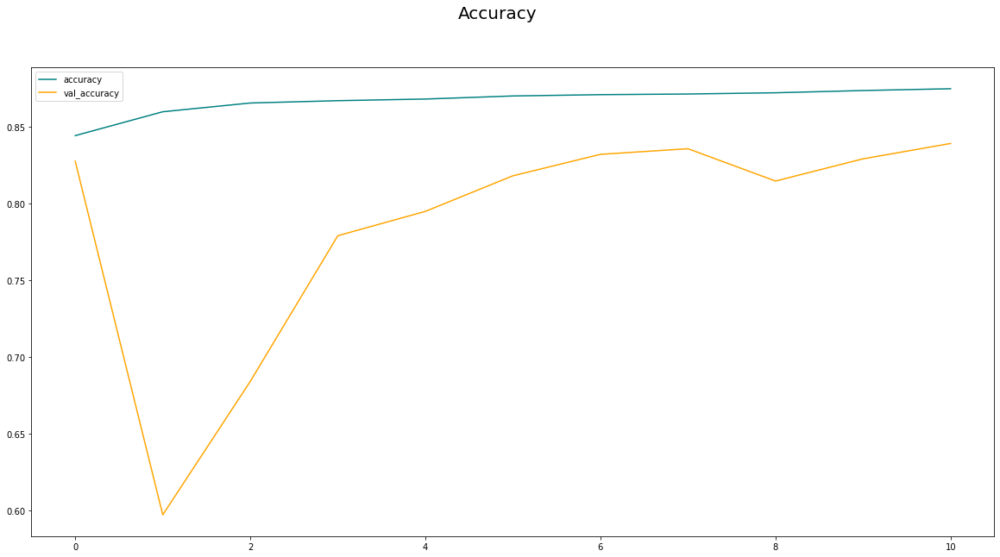

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['accuracy']+hist2.history['accuracy']+hist3.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy']+hist2.history['val_accuracy']+hist3.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Accuracy.png", dpi=199)
plt.show()

In [ ]:
import random
import matplotlib
from matplotlib import animation
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from itertools import count

(1980.0, 2100.0)

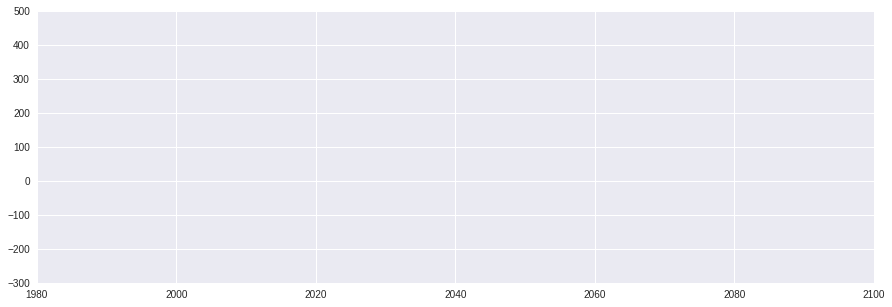

In [ ]:
plt.style.use("seaborn")
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,5))
axes.set_ylim(-300, 500)
axes.set_xlim(1980, 2100)

In [ ]:
l1 = [random.randint(-5,2)+(i**1.83)/(random.randint(13,14)) for i in range(0,160,2)]
l2 = [random.randint(-10,-5)+(i**1.6)/(random.randint(10,12)) for i in range(0,160,2)]
l3 = [random.randint(-20,-10)-(i**1.3)/(random.randint(11,12)) for i in range(0,160,2)]
root_list = [random.randint(-80,-75)+(i**1.5)/(random.randint(10,11)) for i in range(0,80,2)]

l1 = root_list + l1
l2 = root_list + l2
l3 = root_list + l3

In [ ]:
x1,y1,y2,y3 = [], [], [], []
def animate(i):

    x1.append(1980+i)
    y1.append((l1[i]))
    y2.append((l2[i]))
    y3.append((l3[i]))

    axes.plot(x1,y1, color="red", linewidth=0.5)
    axes.plot(x1,y3, color="blue", linewidth=0.5)
    axes.plot(x1,y2, color="gray", linewidth=1)

anim = FuncAnimation(fig, animate, interval=50)

In [ ]:
from matplotlib import rc
rc('animation', html='jshtml')
anim

In [ ]:
f = r"animation.mp4"
writervideo = animation.FFMpegWriter(fps=60)
anim.save(f, writer=writervideo)

In [ ]:
scores = model.evaluate(test_generator, verbose=0)
print("Test Loss", scores[0])
print("Test Accuracy", scores[1])

Test Loss 0.5907713770866394
Test Accuracy 0.8647848963737488


In [ ]:
model3.save_weights('./checkpoints_3/my_checkpoint_3')

In [ ]:
shutil.make_archive("checkpoints_3/my_checkpoint_3", 'zip', "checkpoints_3")

'/content/checkpoints_3/my_checkpoint_3.zip'

In [ ]:
test_data = test_generator.next()
test_data_results = model.predict(test_data[0])
thrhld_results = np.where(test_data_results > 0.5, 1,0)

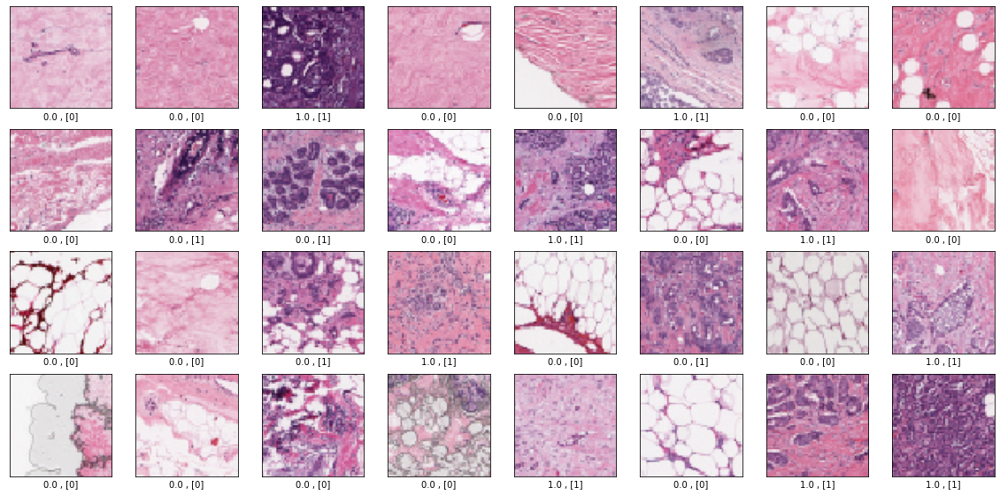

In [ ]:
plt.figure(figsize=(20,20))
for i in range(32):
    plt.subplot(8,8,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_data[0][i])
    plt.xlabel(str(test_data[1][i])+" , "+str(thrhld_results[i]))
plt.show()

### OLD MODEL

In [ ]:
def my_cnn2():
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2))),
  model.add(keras.layers.Dropout(0.2)),
  model.add(layers.Conv2D(64, (3, 3), padding="same",activation='relu'))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(keras.layers.Dropout(0.3)),
  model.add(Flatten())
  model.add(Dense(256, activation='relu'))
  model.add(keras.layers.Dropout(0.3)),
  model.add(Dense(128, activation='relu'))
  model.add(keras.layers.Dropout(0.1)),
  model.add(Dense(1, activation='sigmoid'))
  return model

In [ ]:
model = my_cnn2()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005,)
model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 batch_normalization (BatchN  (None, 62, 62, 32)       128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 31, 31, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 31, 31, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 31, 31, 64)       2

In [ ]:
hist = model.fit(train_generator,epochs=3,validation_data=valid_generator)#0.33

Epoch 1/3
2733/2733 [==============================] - 101s 37ms/step - loss: 0.3774 - accuracy: 0.8468 - val_loss: 0.4172 - val_accuracy: 0.8014
Epoch 2/3
2733/2733 [==============================] - 96s 35ms/step - loss: 0.3307 - accuracy: 0.8603 - val_loss: 0.5238 - val_accuracy: 0.7691
Epoch 3/3
2733/2733 [==============================] - 96s 35ms/step - loss: 0.3127 - accuracy: 0.8689 - val_loss: 0.4160 - val_accuracy: 0.8348


In [ ]:
model.save_weights('./checkpoints_29/my_checkpoint_29')
model2= my_cnn2()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005,)
model2.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])
model2.load_weights('./checkpoints_29/my_checkpoint_29')
hist2 = model2.fit(train_generator,epochs=2,validation_data=valid_generator)#0.3361 Never Give Up

Epoch 1/2
2733/2733 [==============================] - 109s 40ms/step - loss: 0.3012 - accuracy: 0.8739 - val_loss: 0.8377 - val_accuracy: 0.6612
Epoch 2/2
2733/2733 [==============================] - 99s 36ms/step - loss: 0.2924 - accuracy: 0.8774 - val_loss: 0.3757 - val_accuracy: 0.8359


In [ ]:
scores = model2.evaluate(test_generator, verbose=0)
print("Test Loss", scores[0])
print("Test Accuracy", scores[1])

Test Loss 0.35554131865501404
Test Accuracy 0.8458170294761658


In [ ]:
model2.save_weights('./checkpoints_Final_1/my_checkpoint_29')

In [ ]:
shutil.make_archive("checkpoints_Final_1", 'zip', "checkpoints_Final_1")

'/content/checkpoints_Final_1.zip'

In [ ]:
test_data = test_generator.next()
test_data_results = model.predict(test_data[0])
thrhld_results = np.where(test_data_results > 0.5, 1,0)

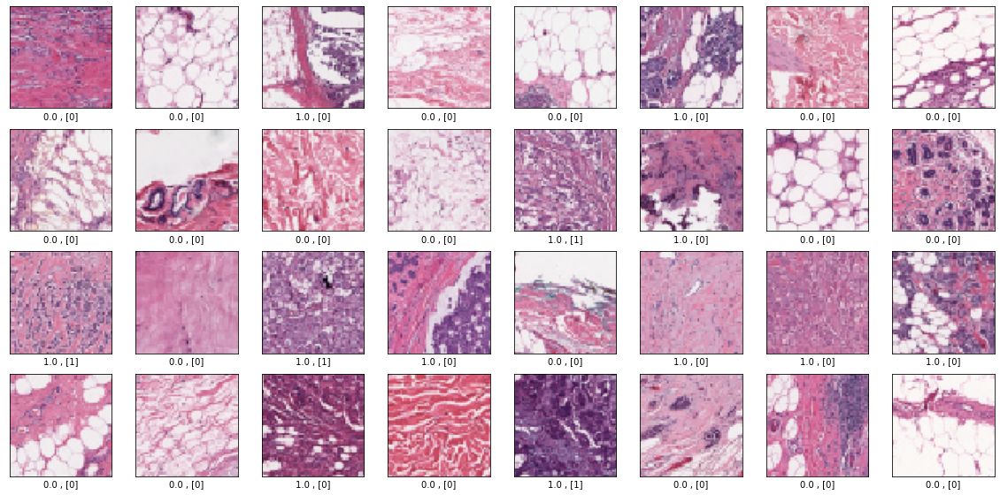

In [ ]:
plt.figure(figsize=(20,20))
for i in range(32):
    plt.subplot(8,8,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_data[0][i])
    plt.xlabel(str(test_data[1][i])+" , "+str(thrhld_results[i]))
plt.show()

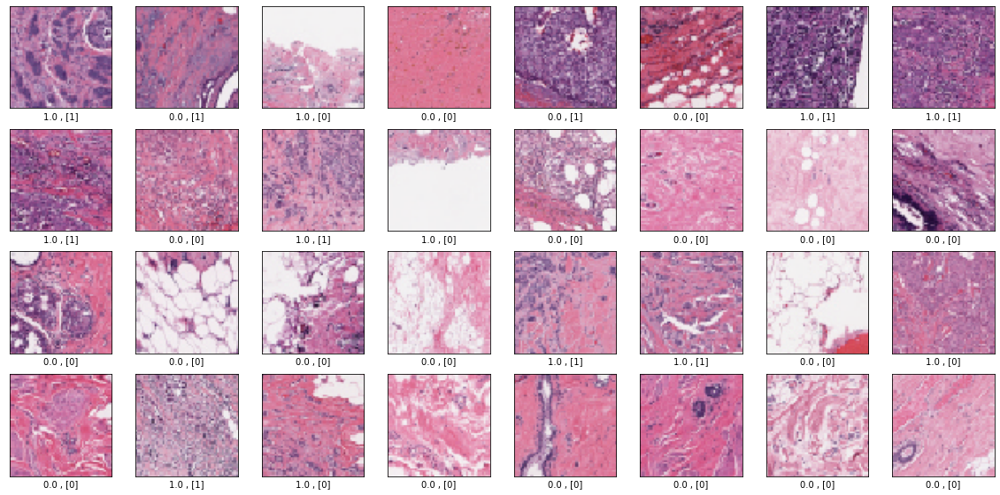

In [ ]:
plt.figure(figsize=(20,20))
for i in range(32):
    plt.subplot(8,8,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_data[0][i])
    plt.xlabel(str(test_data[1][i])+" , "+str(thrhld_results[i]))
plt.show()

### OTHER MODELS

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(INPUT_HEIGHT,
                                  INPUT_WIDTH,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [ ]:
def my_cnn2():
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2))),
  model.add(keras.layers.Dropout(0.2)),
  model.add(layers.Conv2D(64, (3, 3), padding="same",activation='relu'))
  model.add(BatchNormalization())
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(keras.layers.Dropout(0.3)),
  model.add(Flatten())
  model.add(Dense(256, activation='relu'))
  model.add(keras.layers.Dropout(0.3)),
  model.add(Dense(128, activation='relu'))
  model.add(keras.layers.Dropout(0.3)),
  model.add(Dense(1, activation='sigmoid'))
  return model

In [ ]:
model= my_cnn2()

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0005,)
model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
hist = model.fit(train_generator,epochs=2,validation_data=valid_generator)#0.4225

Epoch 1/2
1741/1741 [==============================] - 63s 36ms/step - loss: 0.3863 - accuracy: 0.8456 - val_loss: 0.8044 - val_accuracy: 0.5300
Epoch 2/2
1741/1741 [==============================] - 62s 35ms/step - loss: 0.3320 - accuracy: 0.8623 - val_loss: 0.7715 - val_accuracy: 0.7775


In [ ]:
model.save_weights('./checkpoints_29/my_checkpoint_29')
model2= my_cnn2()
opt = tf.keras.optimizers.Adam(learning_rate=0.0005,)
model2.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])
model2.load_weights('./checkpoints_29/my_checkpoint_29')
hist = model2.fit(train_generator,epochs=1,validation_data=valid_generator)#0.3361 Never Give Up

1741/1741 [==============================] - 67s 38ms/step - loss: 0.3128 - accuracy: 0.8671 - val_loss: 0.3361 - val_accuracy: 0.8731


In [ ]:
model2.save_weights('./checkpoints_Final/my_checkpoint_29')

In [ ]:
shutil.make_archive("checkpoints_Final", 'zip', "checkpoints_Final")

'/content/checkpoints_Final.zip'

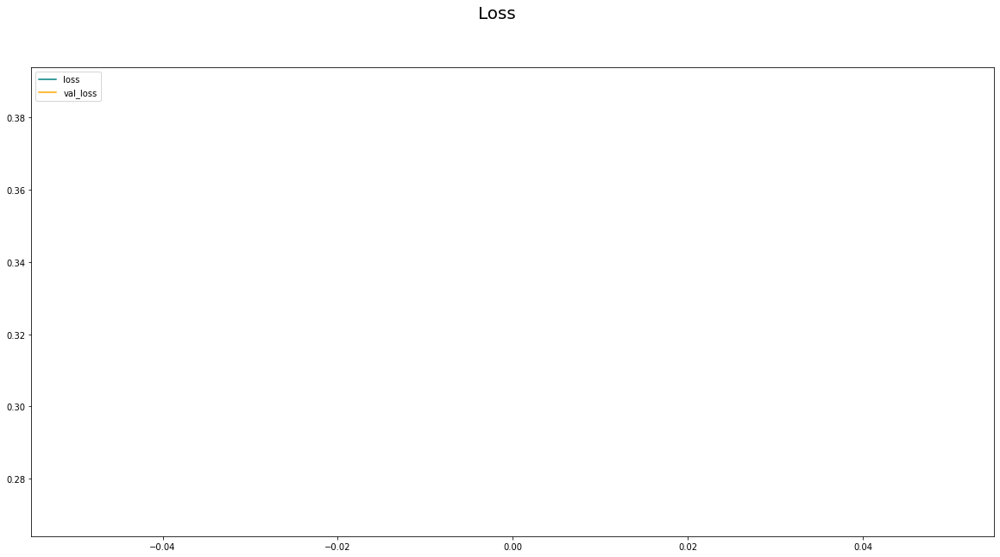

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Loss.png", dpi=199)
plt.show()

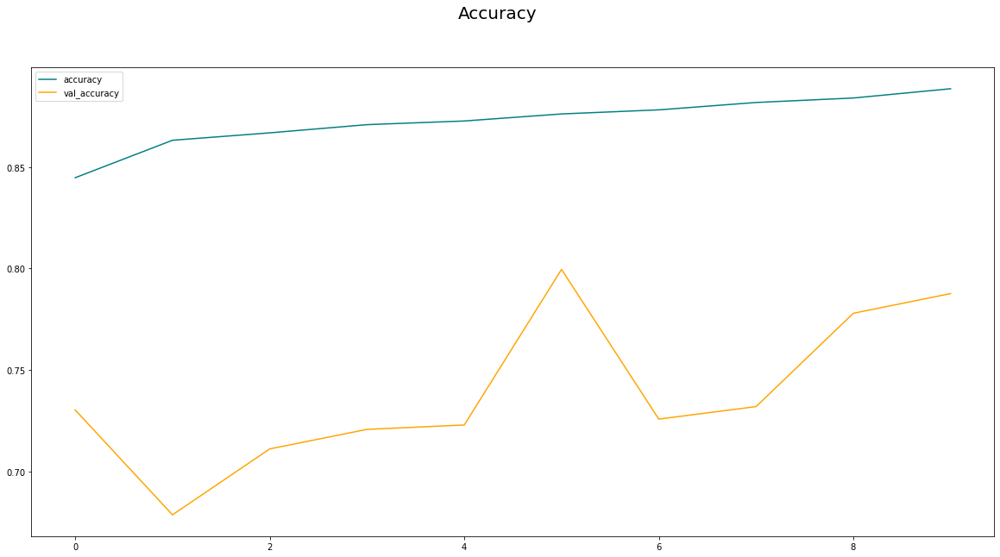

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Accuracy.png", dpi=199)
plt.show()

In [ ]:
scores = model2.evaluate(test_generator, verbose=0)
print("Test Loss", scores[0])
print("Test Accuracy", scores[1])

Test Loss 0.6596296429634094
Test Accuracy 0.801723837852478


In [ ]:
test_data = test_generator.next()

In [ ]:
test_data = test_generator.next()
test_data_results = model.predict(test_data[0])
thrhld_results = np.where(test_data_results > 0.5, 1,0)

In [ ]:
plt.figure(figsize=(20,20))
for i in range(32):
    plt.subplot(8,8,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_data[0][i])
    plt.xlabel(str(test_data[1][i])+" , "+str(thrhld_results[i]))
plt.show()

In [ ]:
from keras.callbacks import EarlyStopping
callback = EarlyStopping(monitor='val_loss', patience=2)

### OTHER MODELS (Overfitting)

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(INPUT_HEIGHT,
                                  INPUT_WIDTH,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [ ]:
def my_cnn2():
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
  model.add(layers.MaxPooling2D((2, 2))),
  model.add(layers.Conv2D(64, (3, 3), padding="same",activation='relu'))
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(Flatten())
  model.add(Dense(256, activation='relu'))
  model.add(keras.layers.Dropout(0.3)),
  model.add(Dense(128, activation='relu'))
  model.add(Dense(1, activation='sigmoid'))
  return model

In [ ]:
model= my_cnn2()

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0005,)
model.compile(optimizer=opt,loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
history = model.fit(train_generator,epochs=10,validation_data=valid_generator)#0.4225

Epoch 1/10
2784/2784 [==============================] - 169s 61ms/step - loss: 0.3676 - accuracy: 0.8434 - val_loss: 0.4991 - val_accuracy: 0.7598
Epoch 2/10
2784/2784 [==============================] - 103s 37ms/step - loss: 0.3343 - accuracy: 0.8593 - val_loss: 0.4415 - val_accuracy: 0.7995
Epoch 3/10
2784/2784 [==============================] - 101s 36ms/step - loss: 0.3181 - accuracy: 0.8660 - val_loss: 0.4979 - val_accuracy: 0.7508
Epoch 4/10
2784/2784 [==============================] - 101s 36ms/step - loss: 0.3031 - accuracy: 0.8733 - val_loss: 0.4954 - val_accuracy: 0.7510
Epoch 5/10
2784/2784 [==============================] - 101s 36ms/step - loss: 0.2891 - accuracy: 0.8796 - val_loss: 0.4174 - val_accuracy: 0.8111
Epoch 6/10
2784/2784 [==============================] - 99s 35ms/step - loss: 0.2718 - accuracy: 0.8879 - val_loss: 0.4644 - val_accuracy: 0.7860
Epoch 7/10
2784/2784 [==============================] - 99s 35ms/step - loss: 0.2514 - accuracy: 0.8973 - val_loss: 0.4

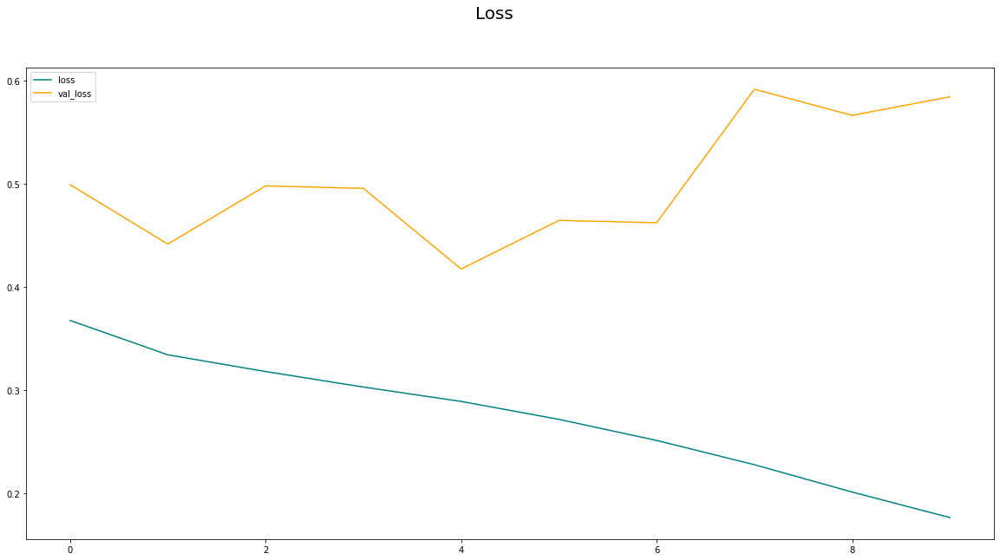

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(history.history['loss'], color='teal', label='loss')
plt.plot(history.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Loss.png", dpi=199)
plt.show()

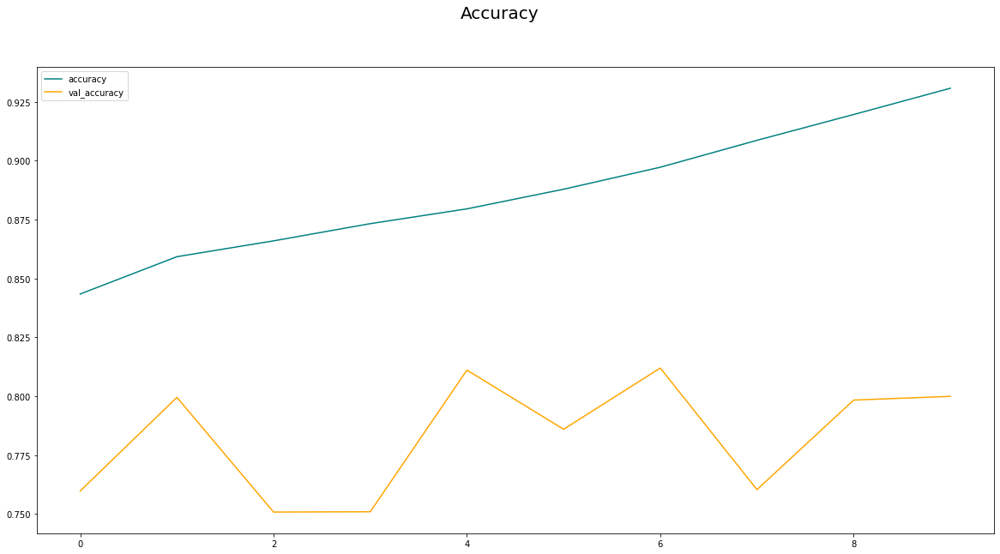

In [ ]:
%matplotlib inline
fig = plt.figure(figsize=(20,10))
plt.plot(history.history['accuracy'], color='teal', label='accuracy')
plt.plot(history.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.savefig("Accuracy.png", dpi=199)
plt.show()

In [ ]:
def build_model(hp):
    model = keras.Sequential([
    data_augmentation,
    keras.layers.Conv2D(
        filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_1_kernel', values = [3,5]),
        activation='relu',
        kernel_regularizer =tf.keras.regularizers.l2( l=0.01),
        input_shape=(INPUT_HEIGHT,INPUT_WIDTH,3)),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Conv2D(
        filters=hp.Int('conv_2_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_2_kernel', values = [3,5]),
        activation='relu',
        kernel_regularizer =tf.keras.regularizers.l2( l=0.01)
        ),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Dropout(0.3),
    keras.layers.Conv2D(
        filters=hp.Int('conv_3_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_3_kernel', values = [3,5]),
        activation='relu',
        kernel_regularizer =tf.keras.regularizers.l2( l=0.01)),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Dropout(0.3),
    keras.layers.Flatten(),
    keras.layers.Dense(
        units=hp.Int('dense_1_units', min_value=32, max_value=128, step=16),
        kernel_regularizer =tf.keras.regularizers.l2( l=0.01),
        activation='relu'
    ),
    keras.layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3])),
              loss='binary_crossentropy',
              metrics=['accuracy'])
    return model